# *

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from copy import copy 
import random

In [192]:
def show(*args, c=2) -> None: 
    l = len(args)
    if l > 4:
        raise Exception("To many images were provide")
    r = max(round(l/c), 1)
    fig = plt.figure(figsize=(20, 15))
    for i, data in enumerate(args):
        pos = i+1
        ax = fig.add_subplot(r, c, pos)
        img_has_parameters = type(data) == tuple
        if img_has_parameters:
            img = data[0]
            name = data[1]
            ax.title.set_text(name)
        else: img = data
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img[:, :, ::-1])
        plt.axis("off")

    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    plt.show()

def normalize(img, alpha=0, beta=1):
    return cv2.normalize(img, None, alpha=alpha, beta=beta, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

def cvt_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# <b>Particle Filter Tracking</b>

<b style="font-size:30px">Implement the particle filter and run it on the pres debate.avi clip.</b>

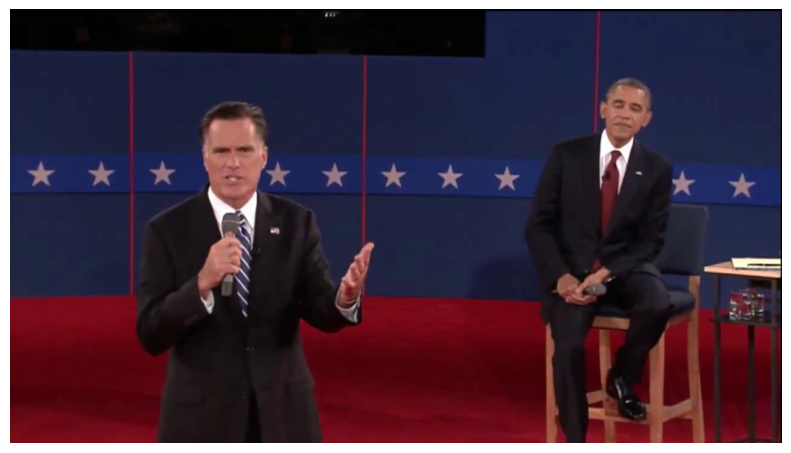

In [193]:
cap = cv2.VideoCapture('./input/pres_debate.avi')
ret,  frame = cap.read()
show(frame)

In [194]:
def get_patch(img, top_left, bottom_right):
    patch = img[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
    return patch

In [195]:
class PFT:
    def __init__(self, patch, x, y, w, h, N=200, eps=10, std=10e4, alpha=0.0):
        self.particles = np.empty((N, 2), dtype=np.int32)
        self.particles[:, 0] = np.random.uniform(0, w, N)
        self.particles[:, 1] = np.random.uniform(0, h, N)

        self.weights = np.ones(N, dtype=np.float32)/N
        self.state = np.array([x, y], dtype=np.int32)

        self.w = w
        self.h = h
        self.std = std
        self.eps = eps
        self.N = N
        self.alpha = alpha
        self.patch = patch 

    def predict(self):
        self.particles[:, 0] += (np.random.randn(self.N) * self.eps).astype(np.int32)
        self.particles[:, 1] += (np.random.randn(self.N) * self.eps).astype(np.int32)
        self.__clip_particles()
        return self.particles

    def update_weights(self, image):
        for i in range(self.N):
            particle_patch = self.__get_patch_from_img(image, i)
            self.weights[i] = self.__squared_exponential_equation(patch0=self.patch, patch1=particle_patch)
        self.__normalize_weights()
        return self.weights

    def sample(self):
        self.particles = np.asarray(random.choices(self.particles, weights=self.weights, k=self.N))
        self.weights = np.ones(self.N)/self.N
        return self.particles

    def estimate(self):
        self.state += [np.int32(self.particles[:, 0].mean()), np.int32(self.particles[:, 1].mean())]
        self.state[0] = self.state[0] - self.w//2 -1
        self.state[1] = self.state[1] - self.h//2 -1
        return self.state
    
    def update_model(self, img):
        best_guess = img[self.state[1]:self.state[1]+self.h, self.state[0]:self.state[0]+self.w]
        self.patch = (1 - self.alpha) * self.patch + self.alpha * best_guess
        return self.patch

    def track(self, img):
        self.predict()
        self.update_weights(img)
        self.sample()
        self.estimate()
        self.update_model(img)
        return self.state
    
    def show_particles(self, img, particles=None):
        img = copy(img)
        if particles is None:
            particles = self.particles
        for particle in particles:
            img = cv2.circle(img, particle+self.state, 1, (0, 0, 255))
        return img
    
    def __get_patch_from_img(self, image, i):
        ctr = self.state + self.particles[i]
        return image[ctr[1]-self.h//2-1:ctr[1]+self.h//2, ctr[0]-self.w//2-1:ctr[0]+self.w//2]
    
    def __mse(self, patch0, patch1):
        return np.sum(np.subtract(patch1, patch0)**2)
    
    def __squared_exponential_equation(self, patch0, patch1):
        mse = self.__mse(patch0, patch1)
        eq = np.exp(-np.float32(mse)/self.std)
        return eq
    
    def __normalize_weights(self):
        self.weights /= np.sum(self.weights)

    def __clip_particles(self):
        particles_tmp = self.particles + self.state
        particles_tmp[:, 0] = np.clip(particles_tmp[:, 0], self.w//2+2, 1280-self.w//2-1)
        particles_tmp[:, 1] = np.clip(particles_tmp[:, 1], self.h//2+2, 720-self.h//2-1)
        self.particles = particles_tmp-self.state


In [196]:
patch_coords = np.genfromtxt('./input/pres_debate.txt', dtype=np.int32)
x_y = patch_coords[0, :]
w_h = patch_coords[1, :]
patch = get_patch(frame, x_y, x_y+w_h)

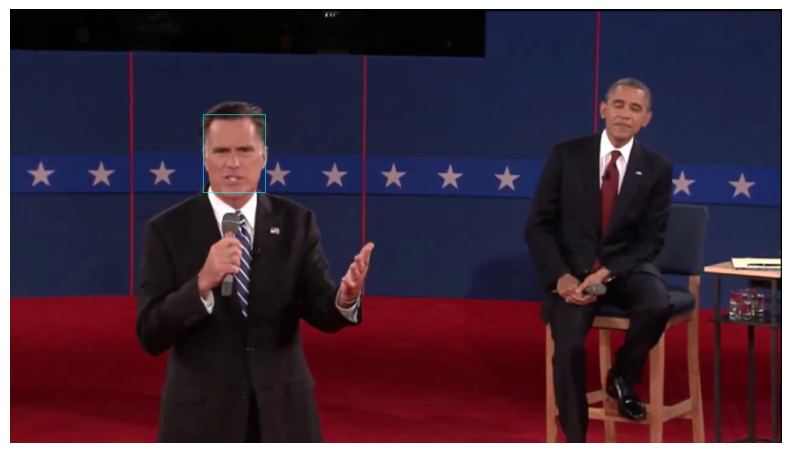

In [197]:
show(cv2.rectangle(copy(frame), x_y, x_y+w_h, color=(255, 255, 0)))

In [198]:
def track_video(x_y, w_h, video_path='./input/pres_debate.avi', 
                return_frames=None, patch=None, 
                eps=10, std=10e3, N=500, alpha=0.0, show_particles=False, wait=1):
    images = []

    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    
    if patch is None:
        patch = get_patch(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), x_y, x_y+w_h)
    elif len(patch.shape) == 3:
        patch = cv2.cvtColor(patch, cv2.COLOR_BGR2GRAY)

    pft = PFT(patch,  x_y[0], x_y[1], w_h[0], w_h[1], N=N, std=std, eps=eps, alpha=alpha)

    count = 0
    while cap.isOpened():

        ret, frame = cap.read()
        if not ret:
            break
        count += 1

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        x  = pft.track(gray)

        if cv2.waitKey(wait) & 0xFF == ord('q'):
            break

        tracked = cv2.rectangle(copy(frame), x, x+w_h, color=(255, 255, 0))

        if show_particles:
            tracked = pft.show_particles(tracked, particles=None)

        if not return_frames is None and count in return_frames:
            images.append(tracked)
        
        cv2.imshow("frame", tracked) 
        
    cap.release()
    cv2.destroyAllWindows()
    
    return images

In [199]:
frames = track_video(x_y, w_h, std=10e5, N=100, wait=25, show_particles=True, eps=10, alpha=0.0, return_frames=[28, 84, 144, 204])

<b style="font-size:30px">Run the tracker and save the video frames 28, 84, and 144 with the visualizations overlaid.</b>

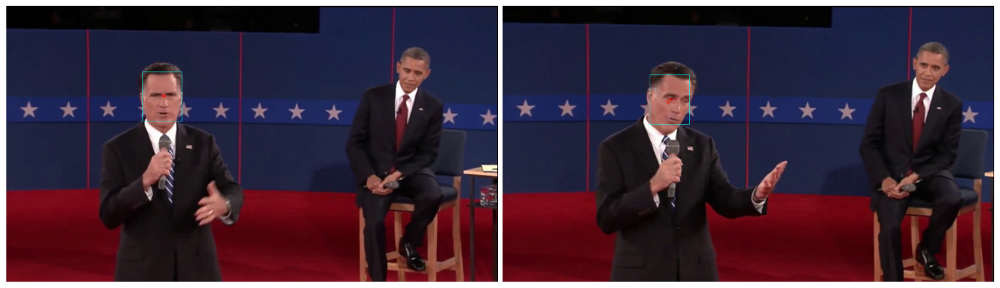

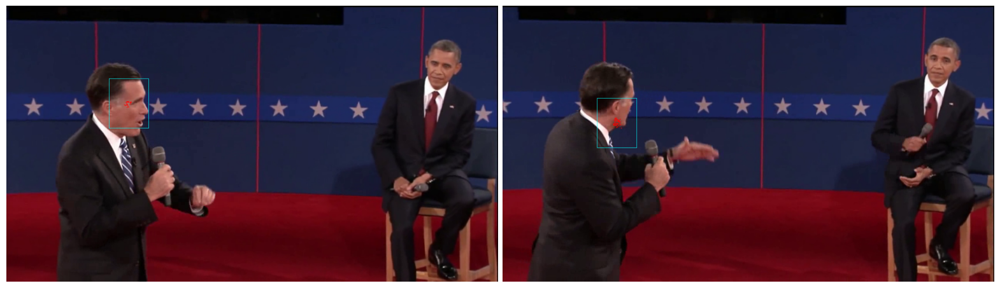

In [200]:
show(*frames[:2])
show(*frames[2:])

<b style="font-size:30px">Run your tracker on noisy debate.avi and save the video frames 14, 32, and 46 with the visualizations overlaid

In [201]:
patch = get_patch(frame, x_y, x_y+w_h)

In [202]:
patch_coords = np.genfromtxt('./input/noisy_debate.txt', dtype=np.int32)
x_y = patch_coords[0, :]
w_h = patch_coords[1, :]
frames = track_video(x_y, w_h, video_path='./input/noisy_debate.avi', std=10e5, patch=patch, eps=30, N=500, show_particles=True, return_frames=[14, 32, 46, 60])

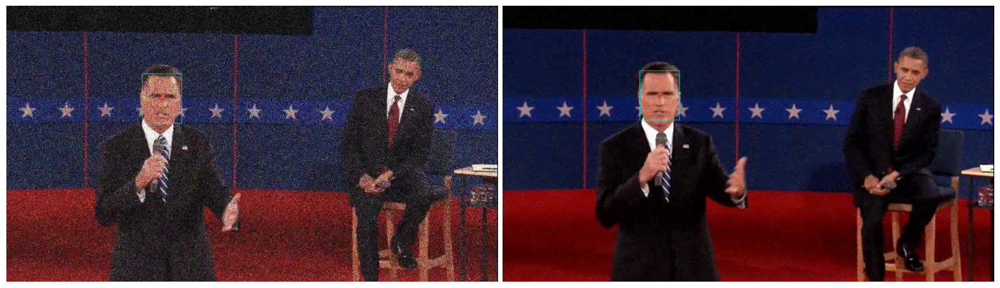

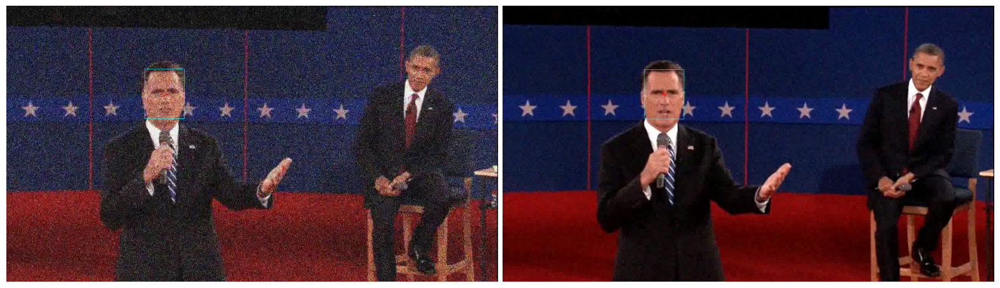

In [203]:
show(*frames[:2])
show(*frames[2:])

# <b>Appearance Model Update<b>

<b>Modify your existing tracker to include a step which uses the history to update the tracking window model.<br><br>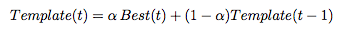<br><br><b><i>`update_model function added in PFT class`</i></b>

<b style="font-size:30px">Run the tracker on pres_debate.avi and adjust parameters until you can track Romney’s hand up to frame 140

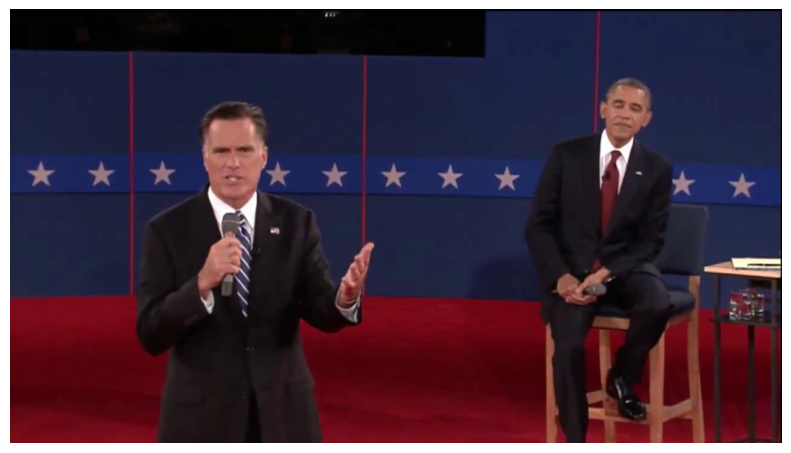

In [204]:
cap = cv2.VideoCapture('./input/pres_debate.avi')
ret,  frame = cap.read()
show(frame)

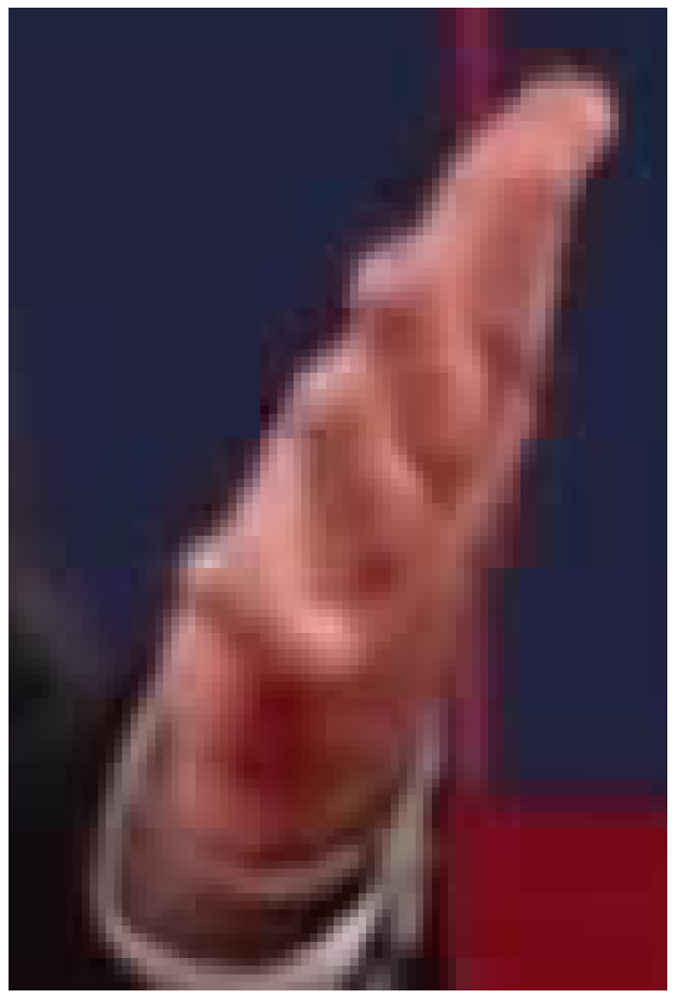

In [205]:
show(get_patch(frame, [529, 379], [610, 500]))

In [206]:
x_y = np.asarray([529, 379])
w_h = np.asarray([81, 121])

In [207]:
patch = get_patch(frame, x_y, x_y+w_h)

<b style="font-size:30px">Run the tracker and save the video frames 15, 50, and 140 with the visualizations overlaid.<b>

In [208]:
frames = track_video(x_y, w_h, video_path='./input/pres_debate.avi', std=10e5, patch=patch, eps=10, N=500, show_particles=True, return_frames=[15, 50, 90, 140], alpha=0.08)

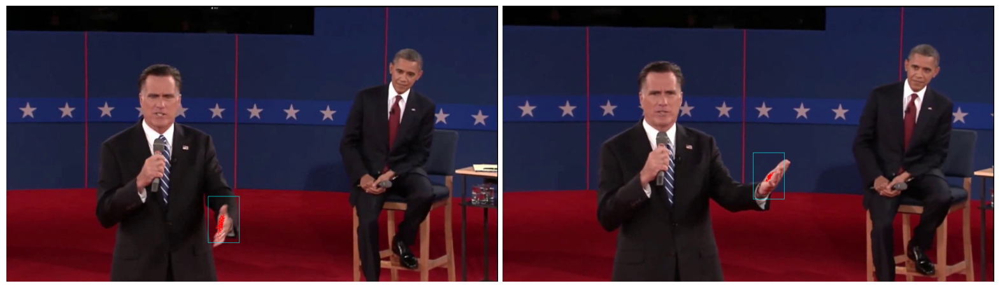

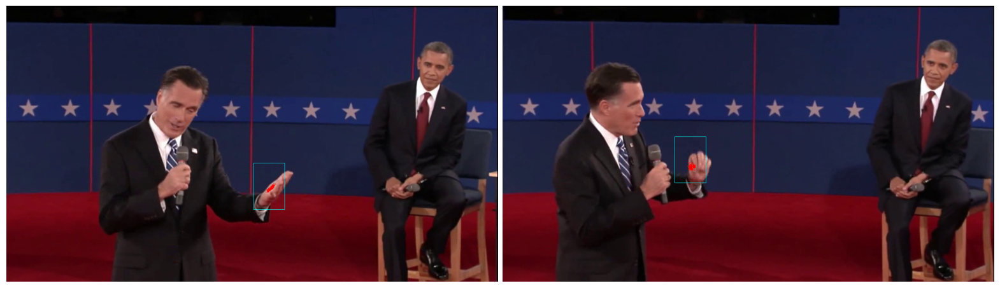

In [209]:
show(*frames[:2])
show(*frames[2:])

<b style="font-size:30px">Test on noisy video<b>

In [210]:
frames = track_video(x_y, w_h, video_path='./input/noisy_debate.avi', std=10e5, patch=patch, eps=20, N=500, show_particles=True, return_frames=[15, 50, 90, 140], alpha=0.15)

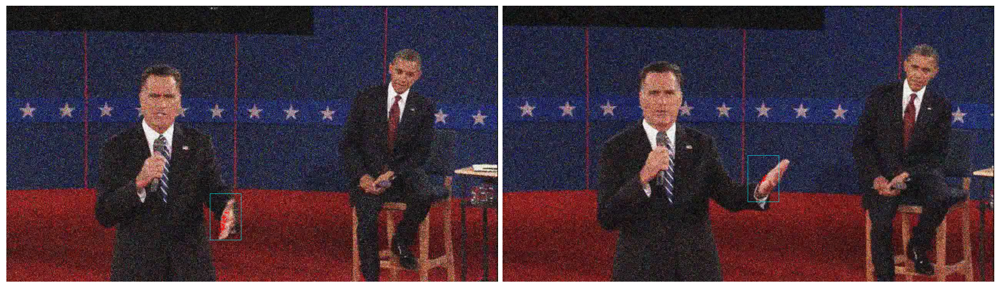

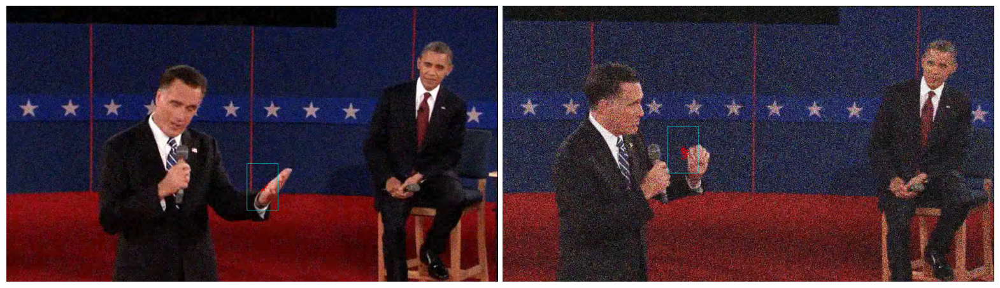

In [211]:
show(*frames[:2])
show(*frames[2:])

# <b>Mean-Shift Lite